In [1]:
import sys

if 'ipykernel_launcher' in sys.argv[0]:
    sys.argv = [sys.argv[0]]

In [3]:
import os
import pandas as pd
import numpy as np

from tqdm import tqdm
from src.models import *
from src.constants import *
from src.plotting import *
from src.pot import pot_eval
from src.utils import *
from src.diagnosis import *
from src.merlin import *
from torch.utils.data import Dataset, DataLoader, TensorDataset
import torch.nn as nn
from time import time
from pprint import pprint

import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

### Data loading

In [4]:
# Data folders
output_folder = 'processed'
data_folder = 'data'

In [5]:
def load_dataset(category, filename, dataset, dataset_folder):
    temp = np.genfromtxt(os.path.join(dataset_folder, category, filename),
                         dtype=np.float64,
                         delimiter=',')
    print(dataset, category, filename, temp.shape)
    return temp, temp.shape

In [6]:
def load_dataset_2(category, filename, dataset, dataset_folder, shape):
	temp = np.zeros(shape)
	with open(os.path.join(dataset_folder, 'interpretation_label', filename), "r") as f:
		ls = f.readlines()
	for line in ls:
		pos, values = line.split(':')[0], line.split(':')[1].split(',')
		start, end, indx = int(pos.split('-')[0]), int(pos.split('-')[1]), [int(i)-1 for i in values]
		temp[start-1:end-1, indx] = 1
	print(dataset, category, filename, temp.shape)
	return temp

In [7]:
train = {}
test = {}
labels = {}
dataset_folder = './data/SMD'
file_list = os.listdir(os.path.join(dataset_folder, "train"))
for filename in file_list:
    if filename.endswith('.txt') and "machine-1-1" in filename:
        dataset_name  = filename.strip('.txt')
        train[dataset_name+'_train'], _ = load_dataset('train', filename, dataset_name, dataset_folder)
        test[dataset_name+'_test'], s = load_dataset('test', filename, dataset_name, dataset_folder)
        labels[dataset_name+'_labels'] = load_dataset_2('labels', filename, dataset_name, dataset_folder, s)

machine-1-1 train machine-1-1.txt (28479, 38)
machine-1-1 test machine-1-1.txt (28479, 38)
machine-1-1 labels machine-1-1.txt (28479, 38)


In [8]:
train['machine-1-1_train'].shape, train['machine-1-1_train']

((28479, 38),
 array([[0.032258, 0.039195, 0.027871, ..., 0.034747, 0.      , 0.      ],
        [0.043011, 0.048729, 0.033445, ..., 0.035833, 0.      , 0.      ],
        [0.043011, 0.034958, 0.03233 , ..., 0.033082, 0.      , 0.      ],
        ...,
        [0.086022, 0.065678, 0.073579, ..., 0.064934, 0.      , 0.      ],
        [0.086022, 0.056144, 0.068004, ..., 0.067178, 0.      , 0.      ],
        [0.075269, 0.081568, 0.072464, ..., 0.065079, 0.      , 0.      ]]))

In [9]:
test['machine-1-1_test'].shape, test['machine-1-1_test'] 

((28479, 38),
 array([[0.075269, 0.065678, 0.070234, ..., 0.0645  , 0.      , 0.      ],
        [0.086022, 0.080508, 0.075808, ..., 0.065224, 0.      , 0.      ],
        [0.075269, 0.064619, 0.071349, ..., 0.067178, 0.      , 0.      ],
        ...,
        [0.064516, 0.080508, 0.050167, ..., 0.043   , 0.      , 0.      ],
        [0.064516, 0.056144, 0.047938, ..., 0.039959, 0.      , 0.      ],
        [0.010753, 0.029661, 0.041249, ..., 0.      , 0.      , 0.      ]]))

In [10]:
labels['machine-1-1_labels'].shape, labels['machine-1-1_labels']

((28479, 38),
 array([[0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        ...,
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.]]))

### Windows construction

In [11]:
def convert_to_windows(data, model):
	windows = [] 
	w_size = model.n_window
	for i, g in enumerate(data): 
		if i >= w_size: 
			w = data[i-w_size:i]
		else: 
			w = torch.cat([data[0].repeat(w_size-i, 1), data[0:i]])
		windows.append(w)
	return torch.stack(windows)

**For x > w,** ---> [x-w:x] ---> x =10, w = 5 ---> [[x6], [x7], [x8], [x9], [x10]]

**For x < w,** ---> x = 3, w = 5 ---> [[x1], [x1], [x1], [x2], [x3]]

**Note:** 

This is for univariate time series, where dimension of window is (5,1). 

For multivariate time series, window size will be (5, c), where c = number of channels. 

### Dataloader

In [12]:
def data_loader():
	global train, test, labels
	loader = []
	for file in ['train', 'test', 'labels']:
		file = 'machine-1-1_' + file
		if file == 'machine-1-1_train':
			loader.append(train[file])
		elif file == 'machine-1-1_test':
			loader.append(test[file])
		elif file == 'machine-1-1_labels':
			loader.append(labels[file])
	# if args.less: loader[0] = cut_array(0.2, loader[0])
	train_loader = DataLoader(loader[0], batch_size=loader[0].shape[0])
	test_loader = DataLoader(loader[1], batch_size=loader[1].shape[0])
	labels_loader = loader[2]
	return train_loader, test_loader, labels_loader

### Model

All the models are created on src.models so we only need to load it from there.

In [13]:
def create_model(modelname, dims):
	import src.models
	model_class = getattr(src.models, modelname)
	model = model_class(dims).double()

	optimizer = torch.optim.AdamW(model.parameters() , lr=model.lr, weight_decay=1e-5)
	scheduler = torch.optim.lr_scheduler.StepLR(optimizer, 5, 0.9)

	print(f"{color.GREEN}Creating new model: {model.name}{color.ENDC}")
	
	epoch = -1
	accuracy_list = []

	return model, optimizer, scheduler, epoch, accuracy_list

### Training function

In [14]:
def backprop(epoch, model, data, dataO, optimizer, scheduler, training = True):
    feats = dataO.shape[1]
    l = nn.MSELoss(reduction = 'none')
    
    data_x = torch.DoubleTensor(data); dataset = TensorDataset(data_x, data_x)
    bs = model.batch if training else len(data)
    dataloader = DataLoader(dataset, batch_size = bs)
    n = epoch + 1; w_size = model.n_window
    l1s, l2s = [], []
    if training:
        for d, _ in dataloader:
            local_bs = d.shape[0]
            window = d.permute(1, 0, 2)
            elem = window[-1, :, :].view(1, local_bs, feats)
            z = model(window, elem)
            l1 = l(z, elem) if not isinstance(z, tuple) else (1 / n) * l(z[0], elem) + (1 - 1/n) * l(z[1], elem)
            if isinstance(z, tuple): z = z[1]
            l1s.append(torch.mean(l1).item())
            loss = torch.mean(l1)
            optimizer.zero_grad()
            loss.backward(retain_graph=True)
            optimizer.step()
        scheduler.step()
        tqdm.write(f'Epoch {epoch},\tL1 = {np.mean(l1s)}')
        return np.mean(l1s), optimizer.param_groups[0]['lr']
    else:
        focus_scores = []
        for d, _ in dataloader:
            window = d.permute(1, 0, 2)
            elem = window[-1, :, :].view(1, bs, feats)
            z = model(window, elem)
            focus_scores.append(z[2])
            if isinstance(z, tuple): z = z[1]
            
        loss = l(z, elem)[0]
        return loss.detach().numpy(), z.detach().numpy()[0], focus_scores

Suppose Train: [1,2,3,4,5] then label: [5] 

Training data without labels is used to train the model. (Self label)

### Model training

In [15]:
train_loader, test_loader, labels_loader = data_loader()

In [16]:
model, optimizer, scheduler, epoch, loss_list = create_model('TranAD', labels_loader.shape[1])

Creating new model: TranAD


In [17]:
## Prepare data
trainD, testD = next(iter(train_loader)), next(iter(test_loader))
trainO, testO = trainD, testD 

trainD, testD = convert_to_windows(trainD, model), convert_to_windows(testD, model)

In [18]:
train['machine-1-1_train'].shape

(28479, 38)

In [19]:
trainD.shape

torch.Size([28479, 10, 38])

In [20]:
### Training phase
print(f'{color.HEADER}Training TranAD on SMD dataset.{color.ENDC}')
num_epochs = 5
e = epoch + 1
lr_list = []
start = time()
for e in tqdm(list(range(epoch+1, epoch+num_epochs+1))):
    lossT, lr = backprop(e, model, trainD, trainO, optimizer, scheduler)
    loss_list.append(lossT)
    lr_list.append(lr)
print(color.BOLD+'Training time: '+"{:10.4f}".format(time()-start)+' s'+color.ENDC)

  0%|          | 0/5 [00:00<?, ?it/s]

Training TranAD on SMD dataset.


 20%|██        | 1/5 [00:04<00:19,  4.82s/it]

Epoch 0,	L1 = 0.04062452985664366


 40%|████      | 2/5 [00:09<00:14,  4.80s/it]

Epoch 1,	L1 = 0.010101247717623617


 60%|██████    | 3/5 [00:14<00:09,  4.76s/it]

Epoch 2,	L1 = 0.00371687158926697


 80%|████████  | 4/5 [00:19<00:04,  4.78s/it]

Epoch 3,	L1 = 0.002748288102607545


100%|██████████| 5/5 [00:23<00:00,  4.80s/it]

Epoch 4,	L1 = 0.002019188275263191
Training time:    23.9878 s


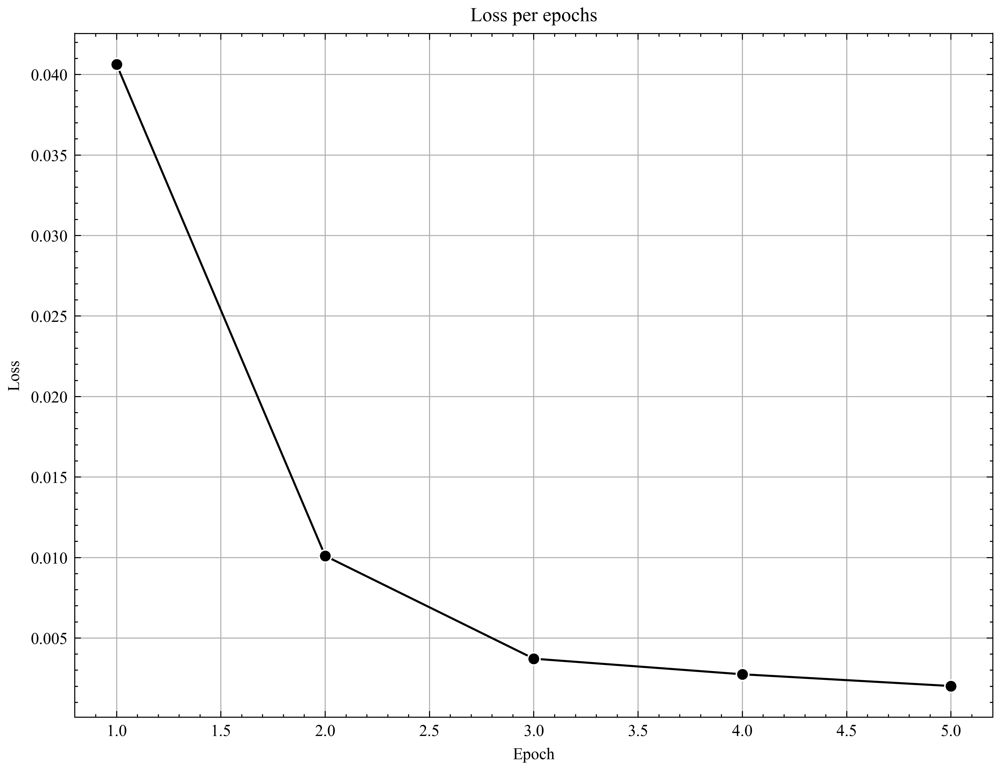

In [21]:
epochs = list(range(1, len(loss_list) + 1))

plt.figure(figsize=(8, 6))

sns.lineplot(x=epochs, y=loss_list, marker='o')

# Set labels and title
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Loss per epochs')
plt.grid(True)
plt.show()


Loss is calculated on training data and from there threshold is calculated. Using threshold from train data and loss from test data, prediction is made. And with prediction and label data, evaluation is done.

In [22]:
testD.shape, testO.shape

(torch.Size([28479, 10, 38]), torch.Size([28479, 38]))

In [23]:
### Testing phase
torch.zero_grad = True
model.eval()
print(f'{color.HEADER}Testing TranAD on SMD dataset{color.ENDC}')
loss, y_pred, focus_scores = backprop(0, model, testD, testO, optimizer, scheduler, training=False)

### Scores
df = pd.DataFrame()
lossT, _, _ = backprop(0, model, trainD, trainO, optimizer, scheduler, training=False)
for i in range(loss.shape[1]):
    lt, l, ls = lossT[:, i], loss[:, i], labels_loader[:, i]
    result, pred = pot_eval(lt, l, ls) 
    preds.append(pred)
    df = df.append(result, ignore_index=True)

lossTfinal, lossFinal = np.mean(lossT, axis=1), np.mean(loss, axis=1)
labelsFinal = (np.sum(labels_loader, axis=1) >= 1) + 0
result, _ = pot_eval(lossTfinal, lossFinal, labelsFinal)
result.update(hit_att(loss, labels_loader))
result.update(ndcg(loss, labels_loader))

Testing TranAD on SMD dataset


In [24]:
print(testO.shape)
print(y_pred.shape)
print(loss.shape)

torch.Size([28479, 38])
(28479, 38)
(28479, 38)


In [25]:
focus_scores = focus_scores[0]
focus_scores = focus_scores.permute(1, 0, 2)
print(focus_scores.shape)

torch.Size([28479, 10, 38])


In [26]:
focus_scores[:, 1, :].shape

torch.Size([28479, 38])

In [27]:
display(df)

,FN,FP,ROC/AUC,TN,TP,f1,precision,recall,threshold
0,409.0,2.0,0.923082,25817.0,2251.0,0.916339,0.999112,0.846241,0.222678
1,0.0,284.0,0.994691,26463.0,1732.0,0.924221,0.859127,1.000000,0.104526
2,0.0,1422.0,0.973864,25782.0,1275.0,0.641990,0.472747,1.000000,0.048616
3,0.0,1776.0,0.967358,25428.0,1275.0,0.589455,0.417896,1.000000,0.032007
4,0.0,0.0,0.000000,28479.0,0.0,0.000000,0.000000,0.000000,0.001075
5,554.0,0.0,0.500000,27925.0,0.0,0.000000,0.000000,0.000000,0.940113
6,0.0,0.0,1.000000,27925.0,554.0,0.999995,1.000000,1.000000,0.102539
7,0.0,0.0,0.000000,28479.0,0.0,0.000000,0.000000,0.000000,0.001186
8,0.0,17.0,0.999671,25795.0,2667.0,0.996818,0.993666,1.000000,0.003627
9,0.0,0.0,1.000000,25819.0,2660.0,0.999995,1.000000,1.000000,0.007699


In [28]:
pprint(result)

{'FN': 7,
 'FP': 272,
 'Hit@100%': 0.4378901802021291,
 'Hit@150%': 0.5785459853232632,
 'NDCG@100%': 0.468112523297705,
 'NDCG@150%': 0.5522423442084845,
 'ROC/AUC': 0.9934187968484415,
 'TN': 25540,
 'TP': 2660,
 'f1': 0.9501646809886324,
 'precision': 0.9072305562509189,
 'recall': 0.9973753243442994,
 'threshold': 0.03961742364861161}


In [29]:
np.array(preds).shape

(38, 28479)

In [30]:
final_preds = np.array([[np.float32(value) for value in sublist] for sublist in preds]).T
final_preds.shape

(28479, 38)

### Visualizations

#### Testing data

## Interpretation with Focus Score

In [32]:
test_data = test['machine-1-1_test']
true_labels = labels['machine-1-1_labels']
predicted_labels = final_preds
print(test_data.shape, true_labels.shape, predicted_labels.shape)

(28479, 38) (28479, 38) (28479, 38)


In [142]:
def plot_test_data(start_index = 15830, end_index=17000, y_pred = y_pred, loss = loss, save_plot = False):
    test_data = test['machine-1-1_test'][start_index : end_index]
    true_labels = labels['machine-1-1_labels'][start_index : end_index]
    predicted_labels = final_preds[start_index : end_index]
    y_pred_interpret = y_pred[start_index : end_index]
    loss_interpret = loss[start_index : end_index]

    # Select channels to plot
    selected_channels = [0, 8, 9, 11, 12, 13, 14, 22]

    # Plotting
    fig, axes = plt.subplots(len(selected_channels)*2, 1, figsize=(15, 20), sharex=True)
    time_steps = np.arange(test_data.shape[0]) + start_index

    for i, axes_i in enumerate(range(0, len(selected_channels)*2, 2)):
        channel = selected_channels[i]
        axes[axes_i].plot(time_steps, test_data[:, channel], label='original data')
        axes[axes_i].plot(time_steps, y_pred_interpret[:, channel], label='predicted data')
        axes[axes_i].fill_between(time_steps, 0, 1, where=true_labels[:, channel] == 1, color='red', alpha=0.5, label='true anomaly')
        axes[axes_i].set_title(f'Channel {channel}', fontsize=12)
        axes[axes_i].set_xlabel('Time', fontsize=10)
        axes[axes_i].set_ylabel('Value', fontsize=10)
        axes[axes_i].grid(True)
        axes[axes_i].legend()

        axes[axes_i + 1].plot(time_steps, loss_interpret[:, channel], color='green', label='anomaly score')
        axes[axes_i + 1].fill_between(time_steps, 0, 1, where=predicted_labels[:, channel] == 1, color='blue', alpha=0.2, label='predicted anomaly')
        axes[axes_i + 1].set_title(f'Channel {channel} - Anomaly Score', fontsize=12)
        axes[axes_i + 1].set_xlabel('Time', fontsize=10)
        axes[axes_i + 1].set_ylabel('Value', fontsize=10)
        axes[axes_i + 1].grid(True)
        axes[axes_i + 1].legend()


    fig.suptitle('Testing data with true anomaly and predicted anomaly', fontsize=16)

    # save the file to anomaly_directory
    if save_plot:
        dir_name = "test_data_plot"
        if not os.path.exists(dir_name):
            os.makedirs(dir_name)
        file_name = f"/Test Data from {start_index} to {end_index}"

        plt.savefig("custom_plot/" + dir_name + file_name)

    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.show()

In [134]:
plot_test_data(start_index = 0, end_index=y_pred.shape[0], y_pred = y_pred, loss = loss)

**Anomaly starts from 15848 and ends at 16366**

In [141]:
plot_test_data(start_index = 15830, end_index=16400, y_pred = y_pred, loss = loss, save_plot = True)

In [140]:
plot_test_data(start_index = 15840, end_index=15860, y_pred = y_pred, loss = loss, save_plot = True)

In [144]:
plot_test_data(start_index = 16360, end_index=16370, y_pred = y_pred, loss = loss, save_plot = True)

### Observing the focus score for a channel

In [54]:
print(focus_scores.shape)
focus_scores_numpy = focus_scores.detach().numpy()

torch.Size([28479, 10, 38])


In [55]:
test_data = test['machine-1-1_test']
true_labels = labels['machine-1-1_labels']
predicted_labels = final_preds

In [143]:
def interpret_focus_score(true_labels, focus_scores, time_point = 15848):
    anomaly = True if 1 in true_labels[time_point] else False
    # print(len(true_labels[time_point]))
    sns.heatmap(focus_scores[time_point, :, :], cmap = "viridis")
    title = f"Anomaly Point {time_point} \n {str(list(np.where(true_labels[time_point] == 1)[0]))}" if anomaly else f"Non-anomoly point {time_point}"

    plt.title(title)
    plt.xlabel("Channel")
    plt.ylabel("Window_size - Lags")

    # save the file to anomaly_directory
    dir_name = "custom_plot/focus_score_heatmap"
    if not os.path.exists(dir_name):
        os.makedirs(dir_name)
    file_name = dir_name + f"/plot_{time_point}.png"
    plt.savefig(file_name)
    plt.show()

In [145]:
# interpret_focus_score(true_labels, focus_scores_numpy, time_point=15848)

In [146]:
# start_index = 16360
# steps = 20
# for i in range(start_index, start_index + steps):
#     interpret_focus_score(true_labels, focus_scores_numpy, time_point=i)

In [147]:
print(focus_scores_numpy.shape)


(28479, 10, 38)


In [148]:
channel_wise_focus_score = np.mean(focus_scores_numpy, axis = 1)
lags_wise_focus_score = np.mean(focus_scores_numpy, axis = 2)
print(channel_wise_focus_score.shape)
print(lags_wise_focus_score.shape)

(28479, 38)
(28479, 10)


In [149]:
def create_donot_plot(focus_score, true_labels, timestep = 15848, channel_focus_score = True, k = 5):
    """
    Input: 
        focus_score(np.array): focus score based on lags or channels
        true_labels(np.array) : true binary label for each channels (28479, 38)
        timestep(int) : focus score donot plot for this timestep
        channel_focus_score(bool) : whether the focus score is for channel or lags
        k(int) : top no. of category not labelled other in donot plot
    """
    row_data = focus_score[timestep].reshape(1, -1)
    if channel_focus_score:
        columns = [f"C{i}" for i in range(row_data.size)]
    else:
        columns = [f"lag{i}" for i in range(row_data.size, 0, -1)]
    data = pd.DataFrame(row_data, columns=columns)


    # Transpose the DataFrame to get columns as index
    data = data.T
    data.columns = ['Values']
    data['Values'] = data['Values'] / data['Values'].sum()

    data = data.sort_values(by='Values', ascending=False)

    top_k = k
    top_5 = data[:top_k]
    other = pd.DataFrame({'Values': [data['Values'][top_k:].sum()]}, index=['Other'])

    # Combine the top 5 with the "Other" section
    final_data = pd.concat([top_5, other])

    # Function to place the percentage labels outside the inner circle
    def func(pct, allvals):
        absolute = int(pct/100.*sum(allvals))
        return "{:.1f}%".format(pct)

    # Create the donut plot
    plt.figure(figsize=(6,6))
    colors = sns.color_palette('pastel')[0:len(final_data)]

    # Create a pie chart with percentage labels
    wedges, texts, autotexts = plt.pie(
        final_data['Values'], 
        labels=final_data.index, 
        colors=colors, 
        startangle=90, 
        counterclock=False, 
        autopct=lambda pct: func(pct, final_data['Values']),
        pctdistance=0.85  # Adjust this to move the labels further from the center
    )

    # Add a white circle at the center to create the donut shape
    centre_circle = plt.Circle((0,0),0.70,fc='white')
    fig = plt.gcf()
    fig.gca().add_artist(centre_circle)

    # Set properties for the text labels
    for autotext in autotexts:
        autotext.set_color('black')
        autotext.set_fontsize(10)

    # Equal aspect ratio ensures that pie is drawn as a circle
    plt.axis('equal')  

    # set the title
    anomaly = True if 1 in true_labels[timestep] else False
    
    if channel_focus_score:
        title = f"Channel Focus Score at t = {timestep} \n" 
        title += f"Anomaly Point = {str(list(np.where(true_labels[timestep] == 1)[0]))}" if anomaly else f"Non-anomoly point {timestep}"
    else: 
        title = f"Lags Focus Score at t = {timestep} \n" 
        title += f"Anomaly Point = {str(list(np.where(true_labels[timestep] == 1)[0]))}" if anomaly else f"Non-anomoly point {timestep}"


    plt.title(title)

    # save the file to anomaly_directory
    dir_name = "custom_plot/donot_plot"
    if not os.path.exists(dir_name):
        os.makedirs(dir_name)
    file_name = f"/channel_focus_score_donotplot_{timestep}.png" if channel_focus_score else f"/lags_focus_score_donotplot_{timestep}.png"

    plt.savefig(dir_name + file_name)

    plt.show()

In [150]:
# create_donot_plot(channel_wise_focus_score, timestep = 15848, true_labels = true_labels, k = 7)
# create_donot_plot(lags_wise_focus_score, timestep = 15848, true_labels = true_labels, channel_focus_score=False, k = 5)

In [130]:
# for time_step in range(15840, 15860):
#     create_donot_plot(channel_wise_focus_score, timestep = time_step, true_labels = true_labels, k = 7)
#     create_donot_plot(lags_wise_focus_score, timestep = time_step, true_labels = true_labels, channel_focus_score=False, k = 5)

In [132]:
# for time_step in range(16360, 16370):
#     create_donot_plot(channel_wise_focus_score, timestep = time_step, true_labels = true_labels, k = 7)
#     create_donot_plot(lags_wise_focus_score, timestep = time_step, true_labels = true_labels, channel_focus_score=False, k = 5)